In [1]:
%run ./imports_models.py
%run ./dataset_preparation_v2.ipynb
%run -i ./utils.py

index:  0
ceros:  3010
total:  25208
percentage:  0.11940653760710886 

index:  1
ceros:  6839
total:  25208
percentage:  0.271302761028245 

index:  2
ceros:  22600
total:  25208
percentage:  0.8965407807045382 

index:  3
ceros:  3051
total:  25208
percentage:  0.12103300539511266 

index:  4
ceros:  22557
total:  25208
percentage:  0.8948349730244367 

index:  5
ceros:  22447
total:  25208
percentage:  0.8904712789590606 

index:  6
ceros:  3010
total:  25208
percentage:  0.11940653760710886 

index:  7
ceros:  10988
total:  25208
percentage:  0.43589336718502064 

index:  8
ceros:  6879
total:  25208
percentage:  0.27288955887019994 

index:  9
ceros:  6854
total:  25208
percentage:  0.2718978102189781 

index:  10
ceros:  22519
total:  25208
percentage:  0.8933275150745795 

index:  11
ceros:  5576
total:  25208
percentage:  0.22119961916851794 

index:  12
ceros:  10863
total:  25208
percentage:  0.43093462392891146 

index:  13
ceros:  18025
total:  25208
percentage:  0.71505077

In [2]:
PATH_SERIALIZER = './../serialized_files/'

In [3]:
PATH = '../../BDForecasting_V2/'
PATH_IMG = './images/'

# Data

In [4]:
%store -r df_complete
%store -r df_grouped_dates
%store -r series_grouped_dates
%store -r pandas_dataframe_groupby_site
%store -r sites_names

In [5]:
df_data = pd.DataFrame({'ds':df_grouped_dates['DATES'], 
                        'y':df_grouped_dates['OCCUPANCY_COUNT']})

## Scaling data (optional)

In [6]:
occ_values_to_scale = df_grouped_dates['OCCUPANCY_COUNT'].values.reshape(-1,1)
scaler = MinMaxScaler()
scaler_fit = scaler.fit(occ_values_to_scale)

df_data['y'] = scaler_fit.transform(occ_values_to_scale)
df_data

,ds,y
0,2018-01-01 01:00:00,0.005059
1,2018-01-01 02:00:00,0.003373
2,2018-01-01 03:00:00,0.005059
3,2018-01-01 04:00:00,0.005059
4,2018-01-01 05:00:00,0.005059
...,...,...
25203,2020-12-31 19:00:00,0.357504
25204,2020-12-31 20:00:00,0.320405
25205,2020-12-31 21:00:00,0.258010
25206,2020-12-31 22:00:00,0.153457


# Save scaler into serialized file

In [7]:
# filename_scaler = ''
# pickle.dump(scaler_fit, open(PATH_SERIALIZER+filename_model,'wb'))

# Split train and test

In [8]:
df_data_train = df_data[:16790]
df_data_test = df_data[16790:]

# Hyperparameter tuning

In [9]:
# cutoffs = pd.to_datetime(['2018-12-31', '2019-05-30', '2019-09-30'])
# param_grid = {
#     'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
#     'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0]
# }

# all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
# rmses = []

# for params in tqdm(all_params):
#     p = Prophet(**params
#                 ).add_seasonality(name='monthly', 
#                                   period=30.5, 
#                                   fourier_order=5, 
#                                   prior_scale=0.02
#                                   ).fit(df_data_train)
#     df_cv = cross_validation(
#                 p, 
# #                 cutoffs=cutoffs, 
#                 horizon='30 days', 
#                 parallel="processes"
#     )
#     df_p = performance_metrics(df_cv, rolling_window=1)
#     rmses.append(df_p['rmse'].values[0])

# tuning_results = pd.DataFrame(all_params)
# tuning_results['rmse'] = rmses
# tuning_results

Model v1 version best parameters

In [ ]:
tuning_results[(tuning_results['changepoint_prior_scale'] == 0.001)
             & (tuning_results['seasonality_prior_scale'] == 0.1)
             & (tuning_results['yearly_seasonality'])
             & (tuning_results['weekly_seasonality'])]

Model v2 (actual) best parameters

In [ ]:
tuning_results[tuning_results['rmse'] == tuning_results['rmse'].min()]

### Save hyperparameter tuning into serialized file

In [ ]:
filename_hyperparameter = ''
pickle.dump(tuning_results, open(PATH_SERIALIZER+filename_hyperparameter,'wb'))

# Instantiate model

In [10]:
prophet_instance = Prophet(yearly_seasonality=True, 
                           weekly_seasonality=True,
                           seasonality_prior_scale=0.01,
                           changepoint_prior_scale=0.01,
                           interval_width=0.95)
prophet_instance.add_seasonality(name='monthly', 
                                 period=30.5, 
                                 fourier_order=5, 
                                 prior_scale=0.02)

prophet_instance.fit(df_data_train)

# Cross validation

In [11]:
cross_validation_results = cross_validation(prophet_instance, 
                                            initial='12000 hours', 
                                            period='3600 hours',
                                            horizon='168 hours')
cross_validation_results

INFO:fbprophet:Making 2 forecasts with cutoffs between 2019-07-27 23:00:00 and 2019-12-24 23:00:00


  0%|          | 0/2 [00:00<?, ?it/s]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2019-07-28 01:00:00,-0.073377,-0.183911,0.043970,0.006745,2019-07-27 23:00:00
1,2019-07-28 02:00:00,-0.068892,-0.183144,0.052569,0.003373,2019-07-27 23:00:00
2,2019-07-28 03:00:00,-0.061588,-0.171390,0.062591,0.003373,2019-07-27 23:00:00
3,2019-07-28 04:00:00,-0.063962,-0.185763,0.057398,0.011804,2019-07-27 23:00:00
4,2019-07-28 05:00:00,-0.049428,-0.158069,0.070237,0.018550,2019-07-27 23:00:00
...,...,...,...,...,...,...
317,2019-12-31 19:00:00,0.429849,0.303089,0.547360,0.349073,2019-12-24 23:00:00
318,2019-12-31 20:00:00,0.326640,0.205324,0.444684,0.335582,2019-12-24 23:00:00
319,2019-12-31 21:00:00,0.238734,0.108140,0.351671,0.239460,2019-12-24 23:00:00
320,2019-12-31 22:00:00,0.149372,0.028768,0.284904,0.151771,2019-12-24 23:00:00


In [12]:
performance_overall_metrics = performance_metrics(cross_validation_results)
mse_mean_training = np.mean(performance_overall_metrics['mse'])
rmse_mean_training = np.mean(performance_overall_metrics['rmse'])
mae_mean_training = np.mean(performance_overall_metrics['mae'])

INFO:fbprophet:Skipping MAPE because y close to 0


In [13]:
training_performace_df = pd.DataFrame({'mse_training':mse_mean_training, 
                                       'rmsetraining':rmse_mean_training, 
                                       'mae_training':mae_mean_training},
                                     index=[0])
training_performace_df

,mse_training,rmsetraining,mae_training
0,0.003436,0.056525,0.045069


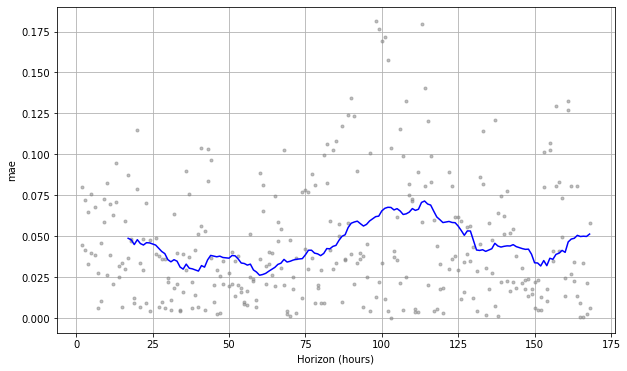

In [14]:
fig_mae_training = plot_cross_validation_metric(cross_validation_results, metric='mae')

# Forecast

In [15]:
forecast = prophet_instance.predict(df_data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01 01:00:00,-0.036880,-0.159862,0.085235
1,2020-01-01 02:00:00,-0.032407,-0.156084,0.085951
2,2020-01-01 03:00:00,-0.025738,-0.141973,0.086829
3,2020-01-01 04:00:00,-0.029414,-0.153370,0.079471
4,2020-01-01 05:00:00,-0.016755,-0.132918,0.100492


# Forecast performance

In [16]:
y_true = df_data_test['y']
y_pred = forecast['yhat']
metrics_evaluation_forecast = get_performance_metrics_forecast(y_true, y_pred)
mse_forecast = metrics_evaluation_forecast[0]
rmse_forecast = metrics_evaluation_forecast[1]
mae_forecast = metrics_evaluation_forecast[2]

In [17]:
forecast_performace_df = pd.DataFrame({'mse_forecast':mse_forecast, 
                                       'rmse_forecast':rmse_forecast, 
                                       'mae_forecast':mae_forecast},
                                     index=[0])
forecast_performace_df

,mse_forecast,rmse_forecast,mae_forecast
0,0.003644,0.060368,0.047245


# Save model into serialized file

In [18]:
# filename_model = ''
# pickle.dump([prophet_instance, forecast, cross_validation_results, performance_overall_metrics], 
#             open(PATH_SERIALIZER+filename_model,'wb'))

# Visualizating

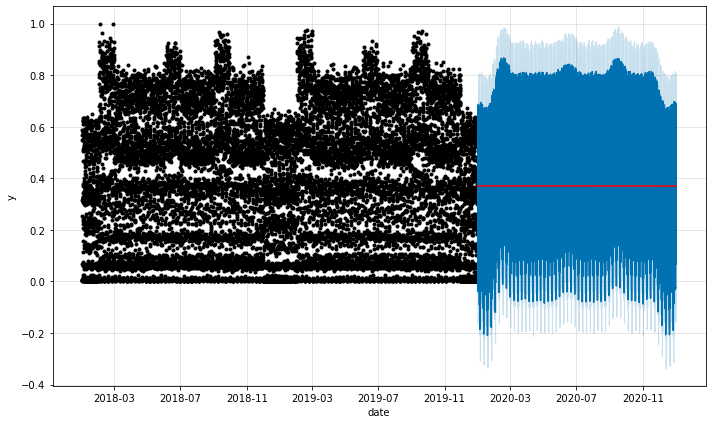

In [19]:
fig_forecast = prophet_instance.plot(forecast, xlabel='date')
a = add_changepoints_to_plot(fig_forecast.gca(), prophet_instance, forecast)
plt.savefig("{}prophet_forecast_default.png".format(PATH_IMG), format="png")

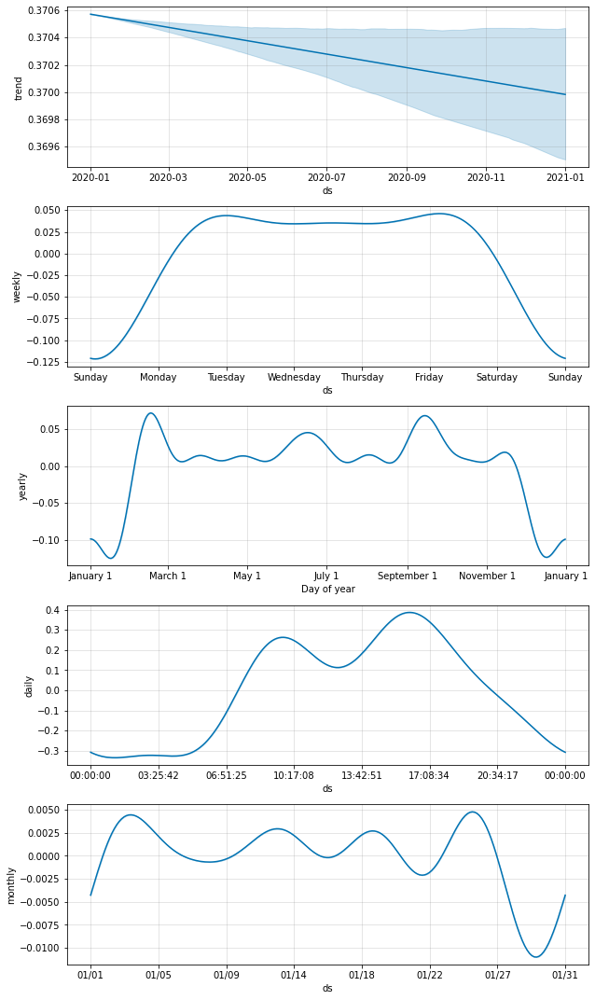

In [20]:
fig_forecast_components = prophet_instance.plot_components(forecast)
plt.savefig("{}prophet_forecast_components_default.png".format(PATH_IMG), format="png")

### Interactive plot

In [21]:
plot_plotly(prophet_instance, forecast)

In [22]:
plot_components_plotly(prophet_instance, forecast)

# Plot by year

In [83]:
y_pred_df = forecast[['ds','yhat']]
y_pred_df.index = series_grouped_dates[16790:].index
y_true_df = df_data_test.copy()
y_true_df['ds'] = pd.to_datetime(y_true_df['ds'])
y_true_df.index = series_grouped_dates[16790:].index

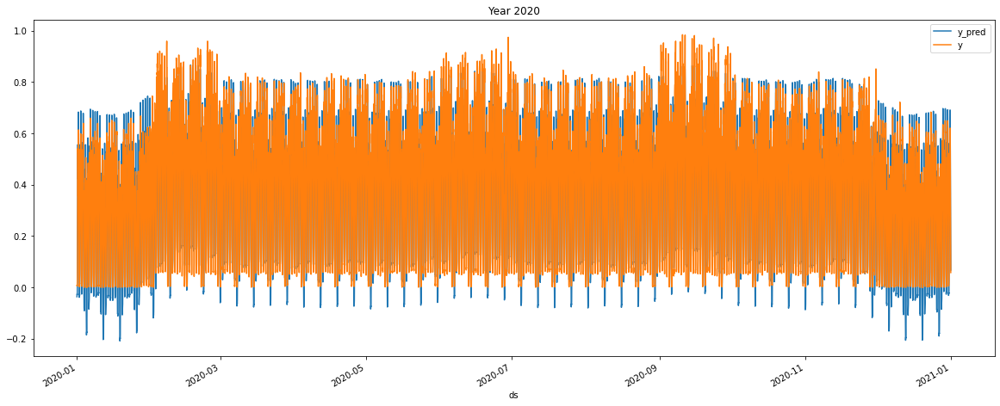

In [84]:
init_date = '2020-01-01'
end_date = '2020-12-31'
ax_2020=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_2020)
plt.title('Year 2020')
plt.savefig("{}prophet_forecast_own.png".format(PATH_IMG), format="png")

# Plots by month

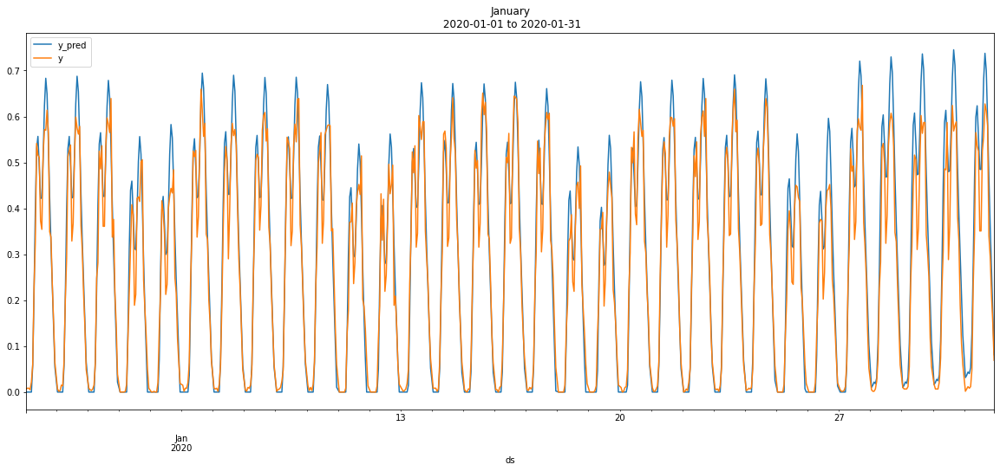

In [109]:
init_date = '2020-01-01'
end_date = '2020-01-31'
ax_jan=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_jan)
plt.title('January\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_january.png".format(PATH_IMG), format="png")

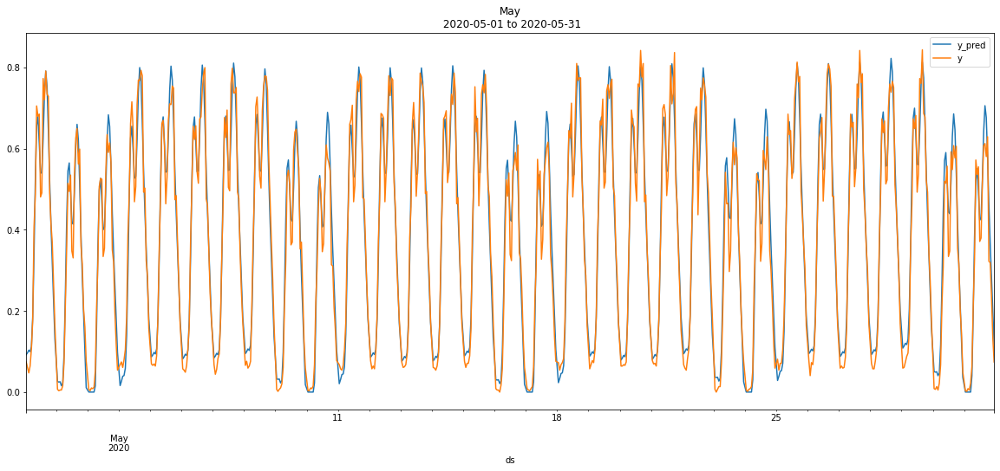

In [110]:
init_date = '2020-05-01'
end_date = '2020-05-31'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020.png".format(PATH_IMG), format="png")

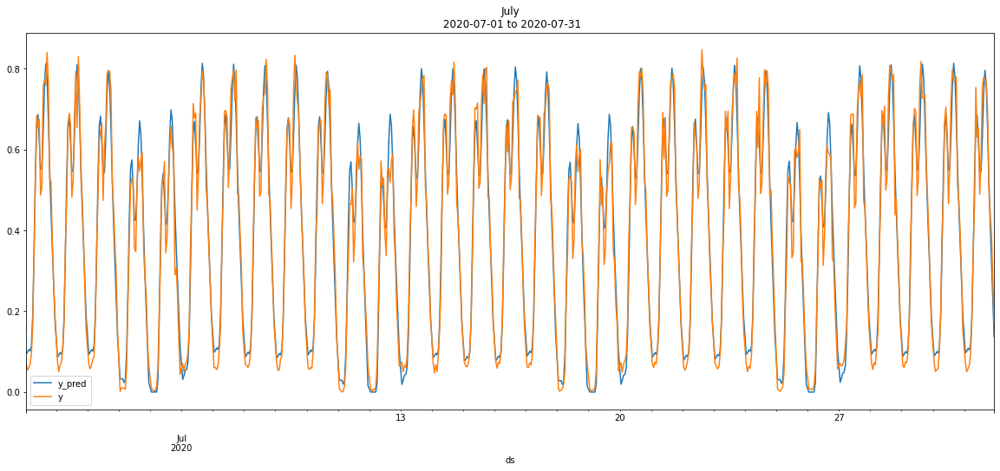

In [111]:
init_date = '2020-07-01'
end_date = '2020-07-31'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('July\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_july.png".format(PATH_IMG), format="png")

# Plots per week

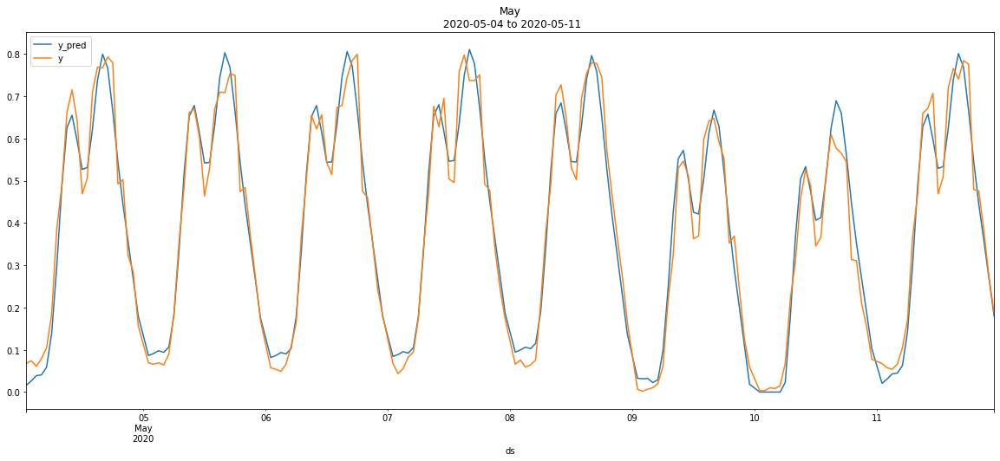

In [112]:
init_date = '2020-05-04'
end_date = '2020-05-11'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_0504_0511.png".format(PATH_IMG), format="png")

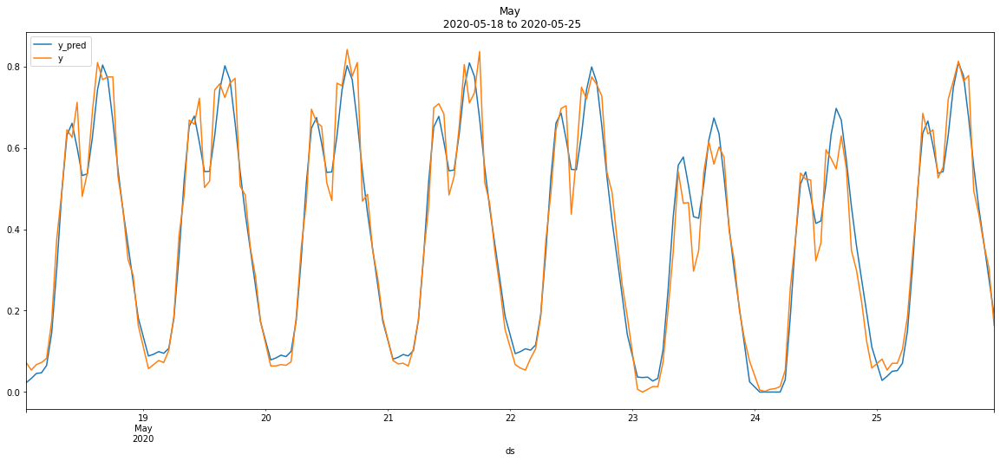

In [113]:
init_date = '2020-05-18'
end_date = '2020-05-25'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_0518_0525.png".format(PATH_IMG), format="png")

# Plots per day

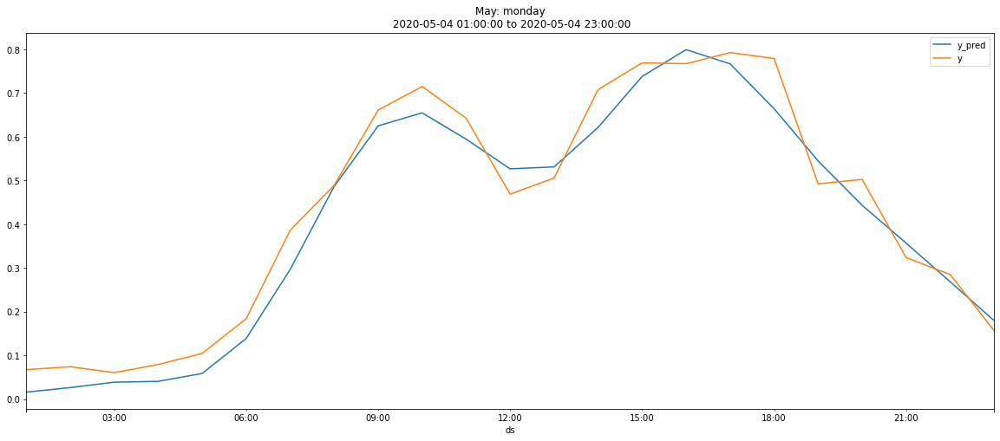

In [114]:
init_date = '2020-05-04 01:00:00'
end_date = '2020-05-04 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: monday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_monday04.png".format(PATH_IMG), format="png")

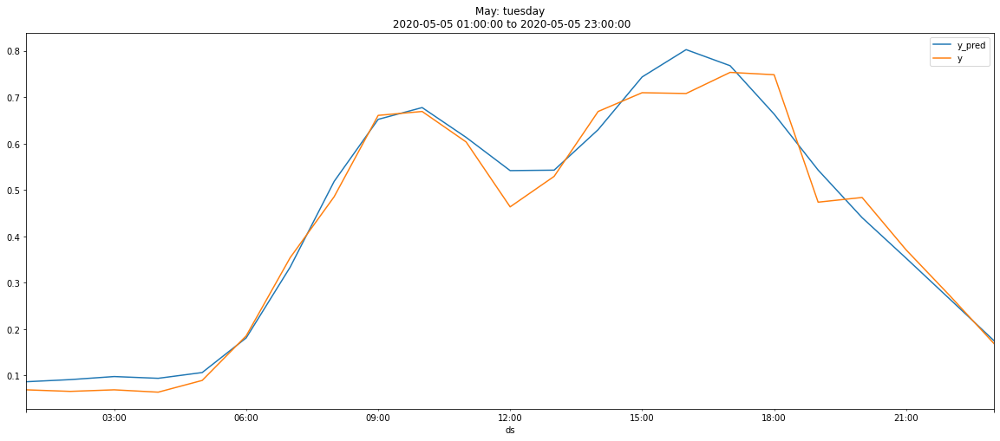

In [115]:
init_date = '2020-05-05 01:00:00'
end_date = '2020-05-05 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: tuesday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_tesday05.png".format(PATH_IMG), format="png")

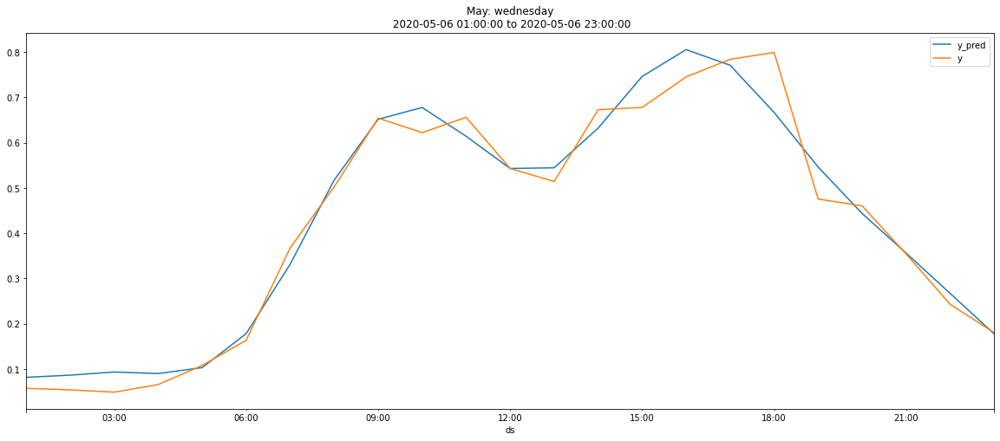

In [116]:
init_date = '2020-05-06 01:00:00'
end_date = '2020-05-06 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: wednesday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_wednesday06.png".format(PATH_IMG), format="png")

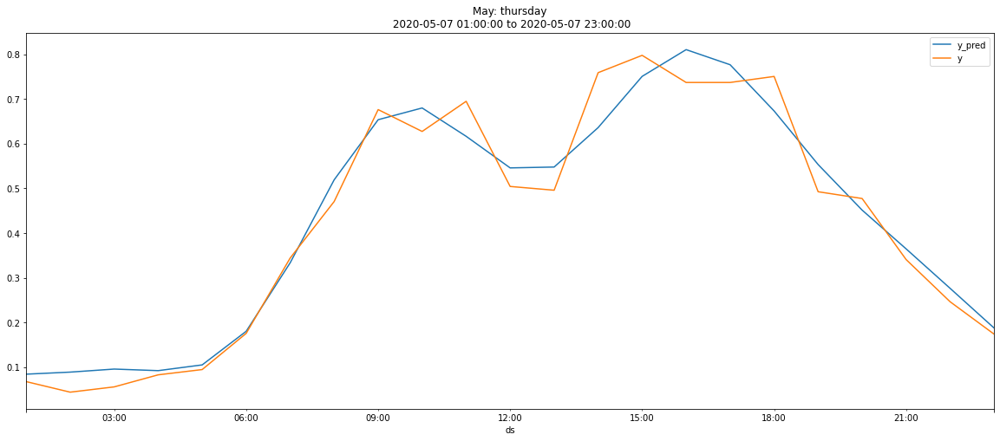

In [117]:
init_date = '2020-05-07 01:00:00'
end_date = '2020-05-07 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: thursday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_thursday07.png".format(PATH_IMG), format="png")

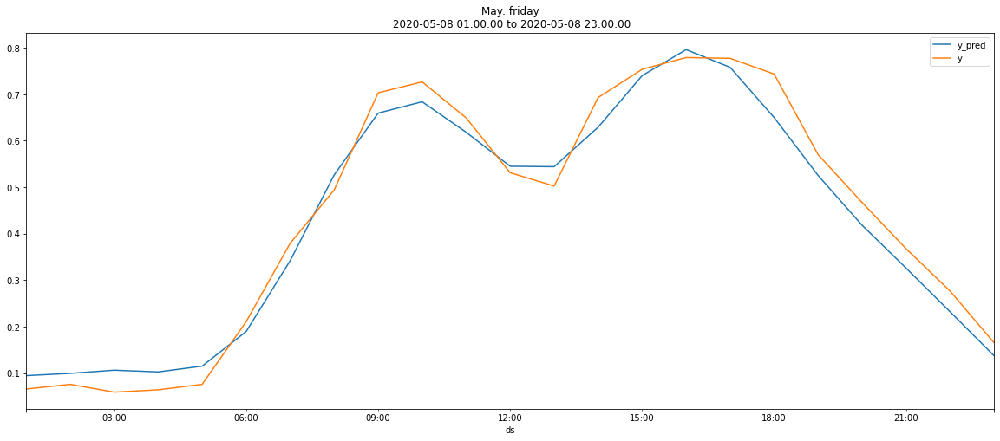

In [118]:
init_date = '2020-05-08 01:00:00'
end_date = '2020-05-08 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: friday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_friday08.png".format(PATH_IMG), format="png")

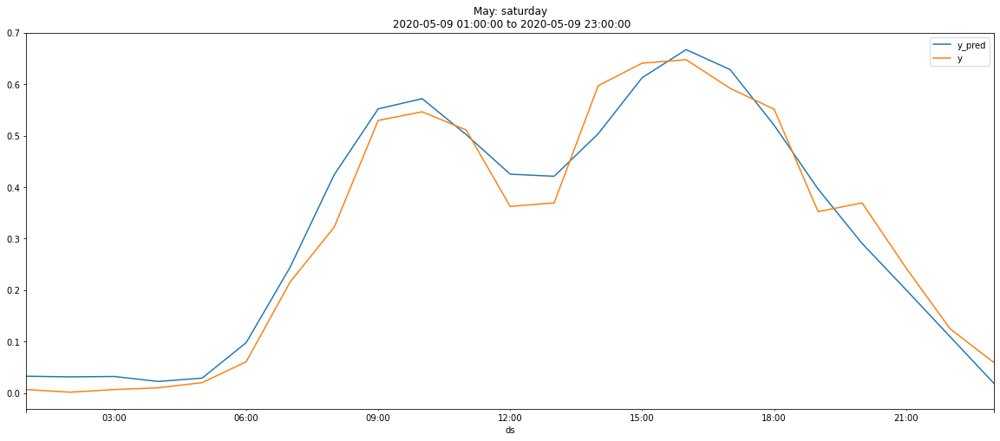

In [119]:
init_date = '2020-05-09 01:00:00'
end_date = '2020-05-09 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: saturday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_saturday09.png".format(PATH_IMG), format="png")

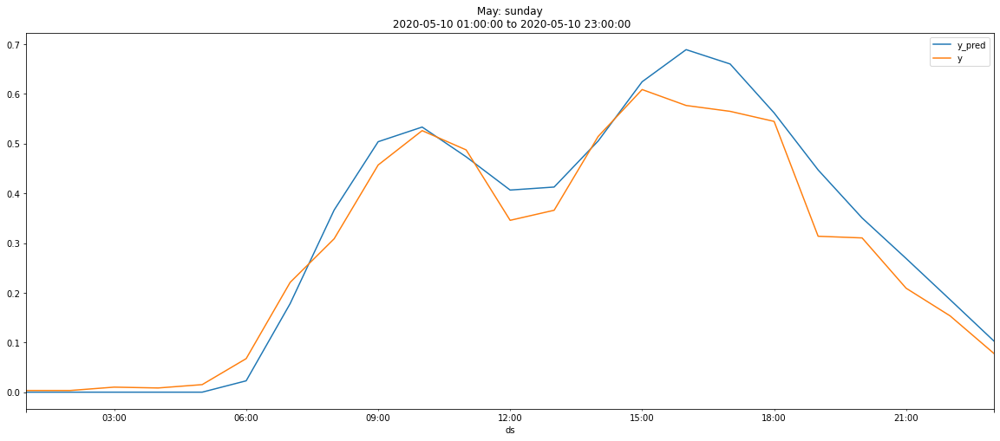

In [120]:
init_date = '2020-05-10 01:00:00'
end_date = '2020-05-10 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: sunday\n %s to %s'%(init_date, end_date))
plt.savefig("{}prophet_forecast_may2020_sunday10.png".format(PATH_IMG), format="png")

# Load model v1

In [56]:
model_scaled_data_v1 = pickle.load(open(PATH_SERIALIZER+'prophet_forecast_components_scaled_data_v1.pkl', 'rb'))

In [57]:
cross_validation_results_v1 = model_scaled_data_v1[2]
performance_overall_metrics_v1 = model_scaled_data_v1[3]
mse_mean_training_v1 = np.mean(performance_overall_metrics_v1['mse'])
rmse_mean_training_v1 = np.mean(performance_overall_metrics_v1['rmse'])
mae_mean_training_v1 = np.mean(performance_overall_metrics_v1['mae'])

In [58]:
forecast_v1 = model_scaled_data_v1[1][['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
y_pred_v1 = forecast_v1['yhat']
mae_forecast_v1 = mean_absolute_error(y_true, y_pred_v1)
mse_forecast_v1 = mean_squared_error(y_true, y_pred_v1)
rmse_forecast_v1 = sqrt(mae_forecast_v1)

ValueError: Found input variables with inconsistent numbers of samples: [8418, 8417]

# Replacing predicted negative values with ceros

### Model v1

In [ ]:
cross_validation_results_no_negative_v1 = replace_negative_values_with_ceros(cross_validation_results_v1.copy())

performance_metrics_training_v1 = get_performance_metrics_training(cross_validation_results_no_negative_v1)
mse_mean_training_no_negative_v1 = performance_metrics_training_v1[0]
rmse_mean_training_no_negative_v1 = performance_metrics_training_v1[1]
mae_mean_training_no_negative_v1 = performance_metrics_training_v1[2]

INFO:fbprophet:Skipping MAPE because y close to 0
C:\Users\59399\AppData\Roaming\Python\Python37\site-packages\numpy\lib\function_base.py:3405: RuntimeWarning:

Invalid value encountered in median



In [ ]:
y_pred_no_negative_v1 = replace_negative_values_with_ceros(forecast_v1.copy(), forecast_df=True)
performance_metrics_forecast_v1 = get_performance_metrics_forecast(y_true, y_pred_no_negative_v1)
mae_mean_forecast_no_negative_v1 = performance_metrics_forecast_v1[0]
mse_mean_forecast_no_negative_v1 = performance_metrics_forecast_v1[1]
rmse_mean_forecast_no_negative_v1 = performance_metrics_forecast_v1[2]
maape_mean_forecast_no_negative_v1 = performance_metrics_forecast_v1[3]

### Model v2

In [59]:
cross_validation_results_no_negative = replace_negative_values_with_ceros(cross_validation_results.copy())

performance_metrics_training = get_performance_metrics_training(cross_validation_results_no_negative)
# mse_mean_training_no_negative = performance_metrics_training[0]
# rmse_mean_training_no_negative = performance_metrics_training[1]
# mae_mean_training_no_negative = performance_metrics_training[2]

INFO:fbprophet:Skipping MAPE because y close to 0
C:\Users\59399\AppData\Roaming\Python\Python37\site-packages\numpy\lib\function_base.py:3405: RuntimeWarning:

Invalid value encountered in median



In [61]:
y_pred_no_negative = replace_negative_values_with_ceros(forecast.copy(), forecast_df=True)
performance_metrics_forecast = get_performance_metrics_forecast(y_true, y_pred_no_negative)
# mae_forecast_no_negative = performance_metrics_forecast[0]
# mse_forecast_no_negative = performance_metrics_forecast[1]
# rmse_forecast_no_negative = performance_metrics_forecast[2]

# Models comparison

### Training

In [ ]:
df_models_comparison_training = pd.DataFrame({'mse':[mse_mean_training_v1, 
                                                     mse_mean_training,
                                                     mse_mean_training_no_negative_v1, 
                                                     mse_mean_training_no_negative],
                                              'rmse':[rmse_mean_training_v1, 
                                                      rmse_mean_training,
                                                      rmse_mean_training_no_negative_v1, 
                                                      rmse_mean_training_no_negative], 
                                              'mae':[mae_mean_training_v1, 
                                                     mae_mean_training,
                                                     mae_mean_training_no_negative_v1, 
                                                     mae_mean_training_no_negative]}, 
                                               index=['training_model_v1',
                                                      'training_model_v2',
                                                      'training_neg_val_replacement_v1',
                                                      'training_neg_val_replacement_v2'])

### Forecast

In [ ]:
df_models_comparison_forecast = pd.DataFrame({'mse':[mse_forecast_v1, 
                                                     mse_forecast,
                                                     mse_mean_forecast_no_negative_v1, 
                                                     mse_forecast_no_negative],
                                              'rmse':[rmse_forecast_v1, 
                                                      rmse_forecast,
                                                      rmse_mean_forecast_no_negative_v1, 
                                                      rmse_forecast_no_negative], 
                                              'mae':[mae_forecast_v1, 
                                                     mae_forecast,
                                                     mae_mean_forecast_no_negative_v1, 
                                                     mae_forecast_no_negative],
                                              'maape':[maape_forecast_v1, 
                                                       maape_forecast,
                                                       maape_mean_forecast_no_negative_v1, 
                                                       maape_forecast_no_negative]},
                                               index=['forecast_model_v1',
                                                      'forecast_model_v2',
                                                      'forecast_neg_val_replacement_v1',
                                                      'forecast_neg_val_replacement_v2'])

NameError: name 'maape_forecast_v1' is not defined

In [ ]:
display(df_models_comparison_training, df_models_comparison_forecast)

In [ ]:
display(df_models_comparison_training, df_models_comparison_forecast)

# Plot by year

In [108]:
y_pred_df = y_pred_no_negative
y_pred_df.index = series_grouped_dates[16790:].index
y_true_df = df_data_test.copy()
y_true_df['ds'] = pd.to_datetime(y_true_df['ds'])
y_true_df.index = series_grouped_dates[16790:].index

Text(0.5, 1.0, 'Year 2020')

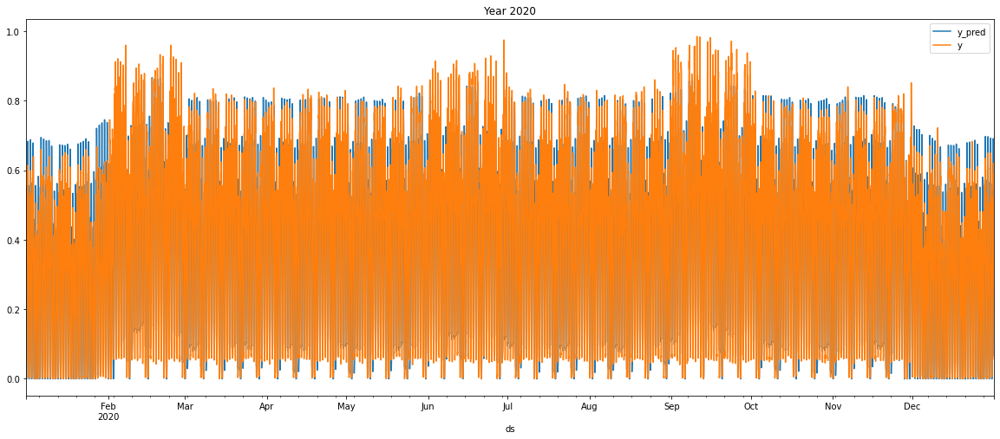

In [63]:
init_date = '2020-01-01'
end_date = '2020-12-31'
ax_2020=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_2020)
plt.title('Year 2020')

# Plots by month

Text(0.5, 1.0, 'January\n 2020-01-01 to 2020-01-31')

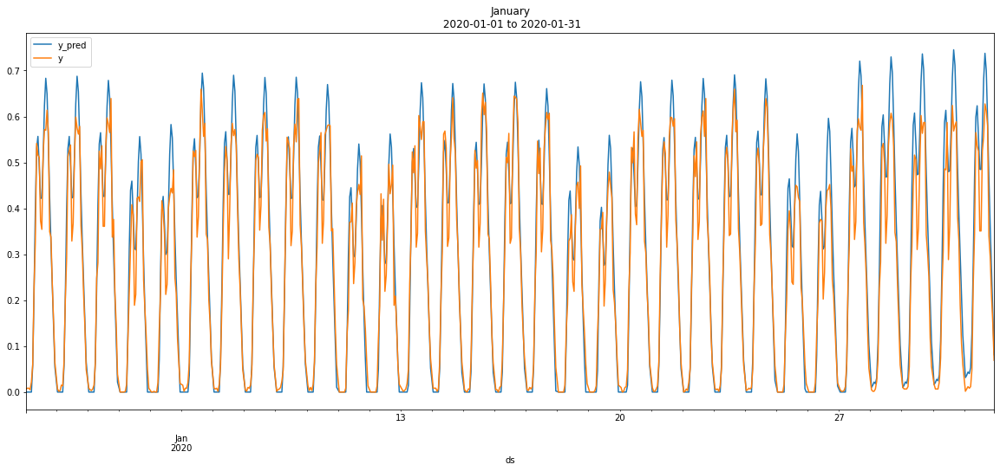

In [64]:
init_date = '2020-01-01'
end_date = '2020-01-31'
ax_jan=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_jan)
plt.title('January\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May\n 2020-05-01 to 2020-05-31')

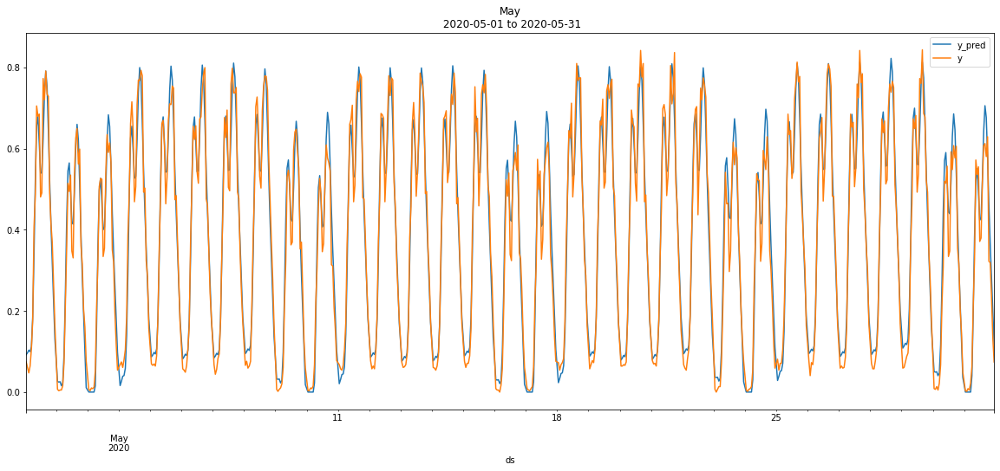

In [65]:
init_date = '2020-05-01'
end_date = '2020-05-31'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'July\n 2020-07-01 to 2020-07-31')

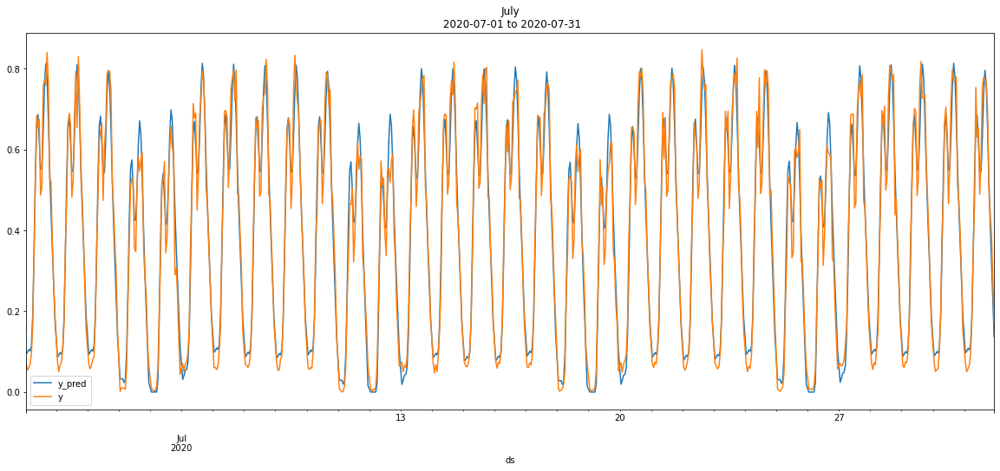

In [66]:
init_date = '2020-07-01'
end_date = '2020-07-31'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('July\n %s to %s'%(init_date, end_date))

# Plots per week

Text(0.5, 1.0, 'May\n 2020-05-04 to 2020-05-11')

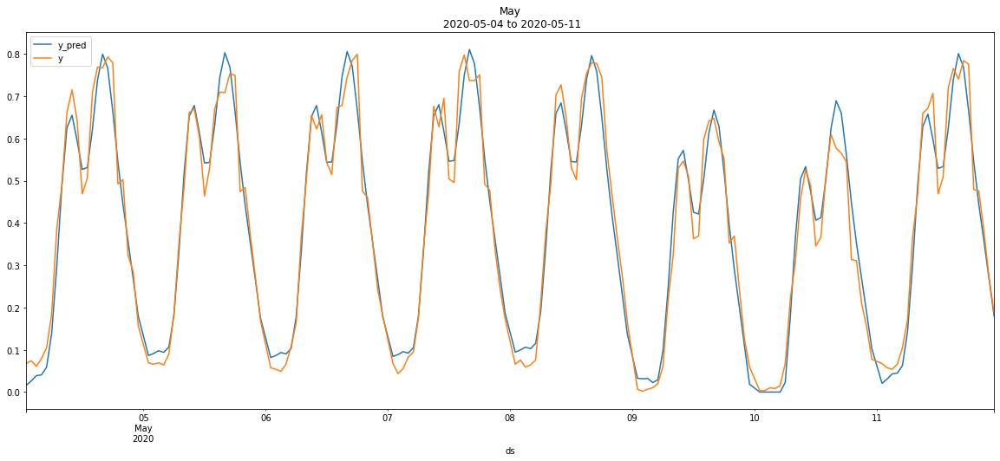

In [67]:
init_date = '2020-05-04'
end_date = '2020-05-11'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May\n 2020-05-18 to 2020-05-25')

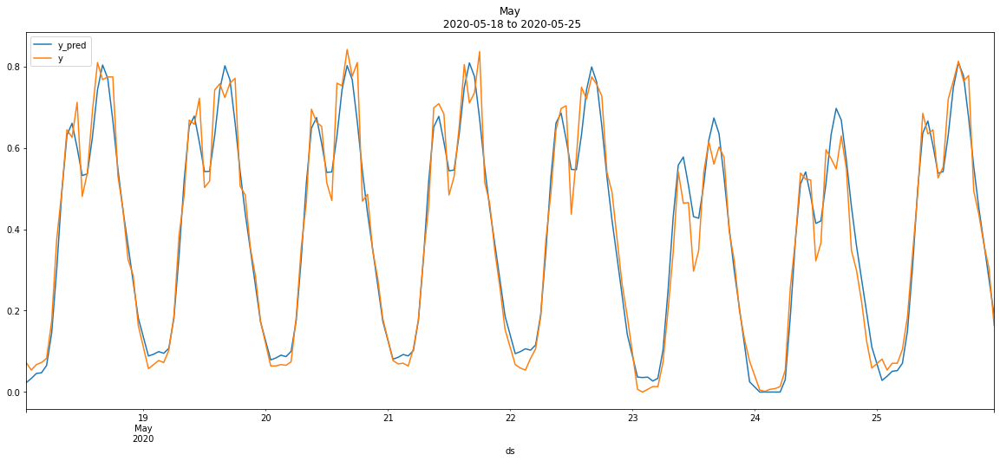

In [68]:
init_date = '2020-05-18'
end_date = '2020-05-25'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

# Plots per day

Text(0.5, 1.0, 'May: monday\n 2020-05-04 01:00:00 to 2020-05-04 23:00:00')

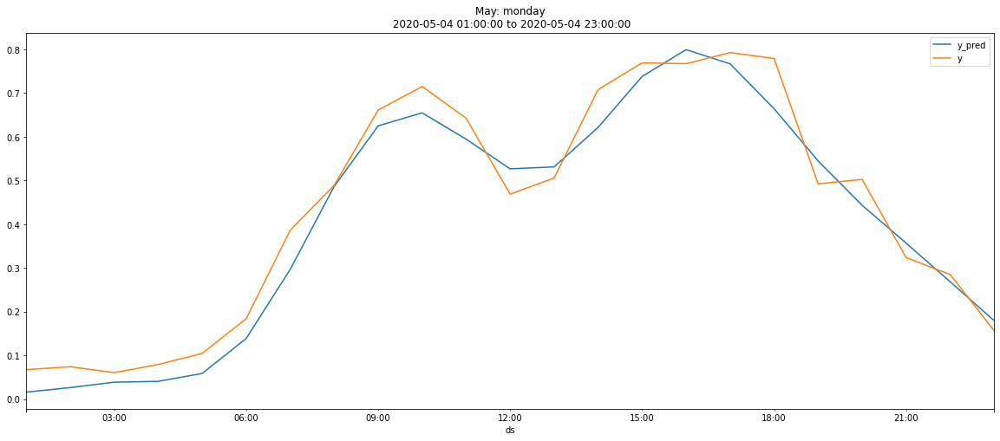

In [69]:
init_date = '2020-05-04 01:00:00'
end_date = '2020-05-04 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: monday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: tuesday\n 2020-05-05 01:00:00 to 2020-05-05 23:00:00')

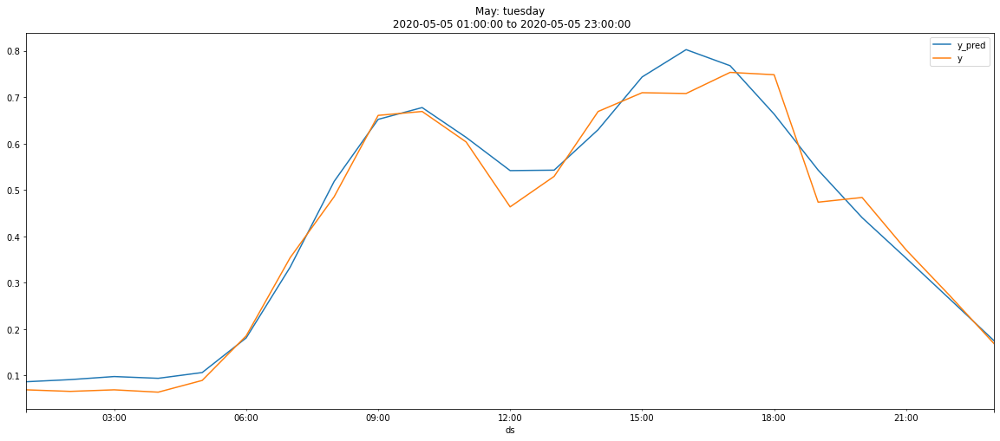

In [70]:
init_date = '2020-05-05 01:00:00'
end_date = '2020-05-05 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: tuesday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: wednesday\n 2020-05-06 01:00:00 to 2020-05-06 23:00:00')

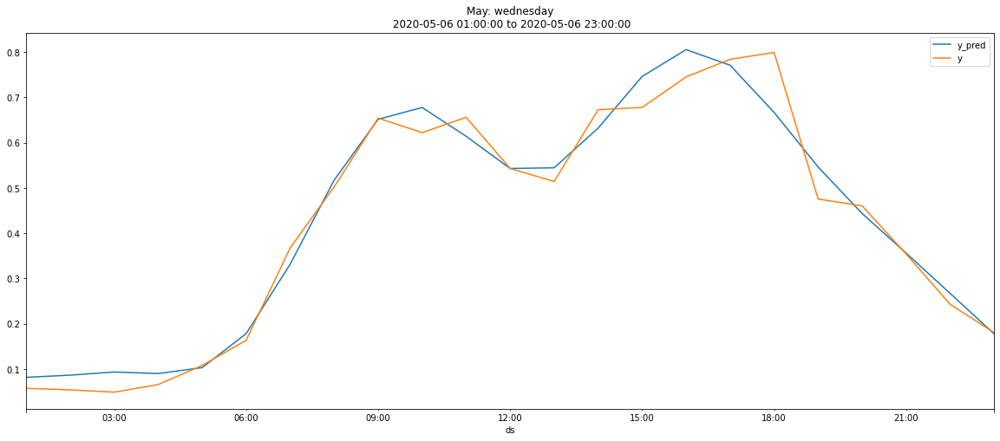

In [71]:
init_date = '2020-05-06 01:00:00'
end_date = '2020-05-06 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: wednesday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: thursday\n 2020-05-07 01:00:00 to 2020-05-07 23:00:00')

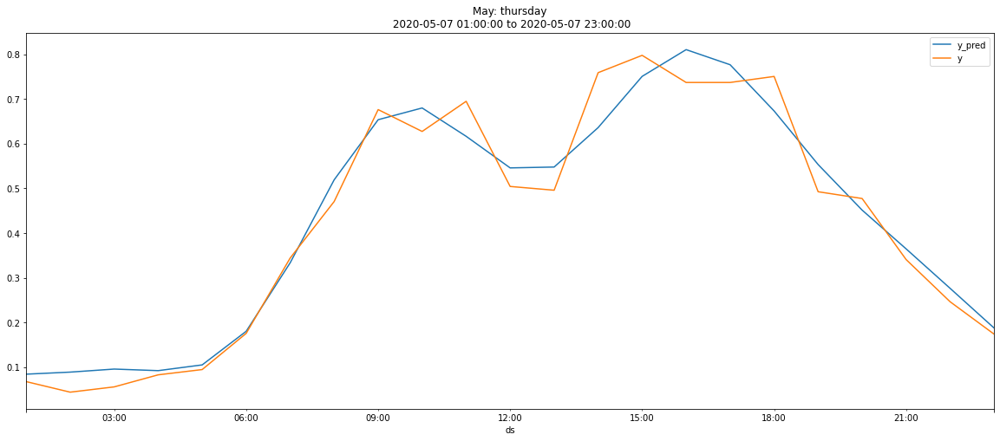

In [72]:
init_date = '2020-05-07 01:00:00'
end_date = '2020-05-07 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: thursday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: friday\n 2020-05-08 01:00:00 to 2020-05-08 23:00:00')

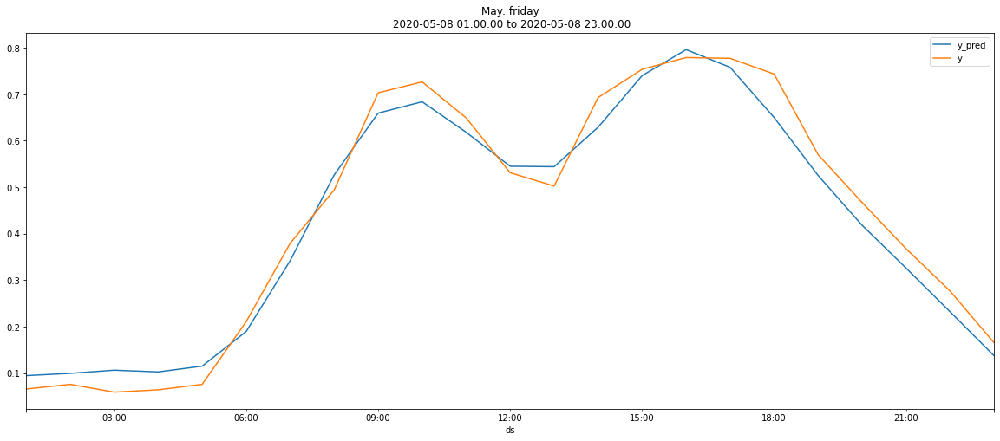

In [73]:
init_date = '2020-05-08 01:00:00'
end_date = '2020-05-08 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: friday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: saturday\n 2020-05-09 01:00:00 to 2020-05-09 23:00:00')

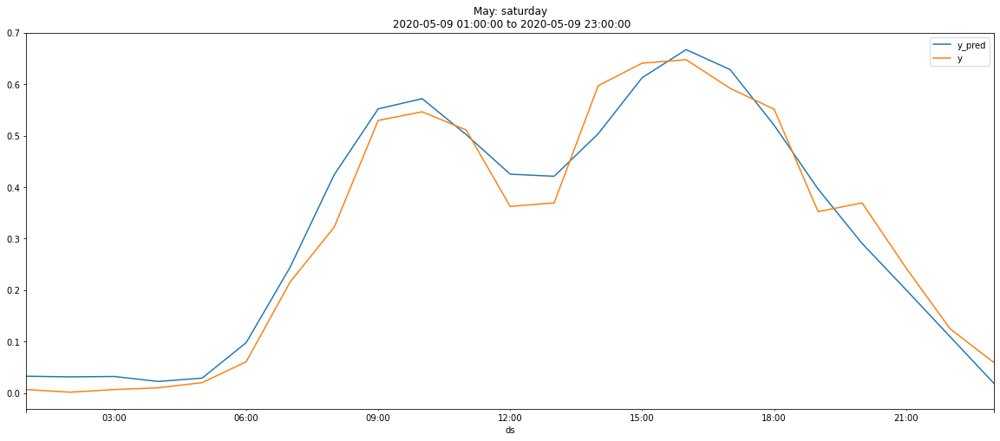

In [74]:
init_date = '2020-05-09 01:00:00'
end_date = '2020-05-09 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: saturday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: sunday\n 2020-05-10 01:00:00 to 2020-05-10 23:00:00')

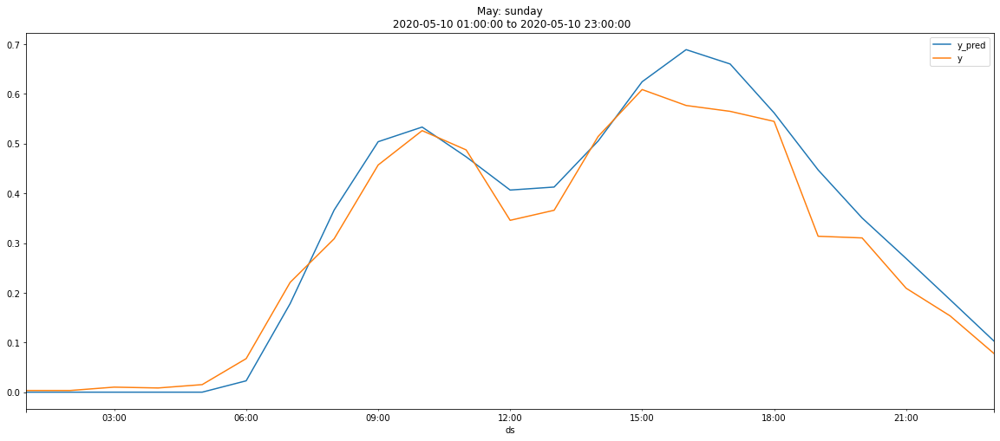

In [75]:
init_date = '2020-05-10 01:00:00'
end_date = '2020-05-10 23:00:00'
ax_aug=y_pred_df[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: sunday\n %s to %s'%(init_date, end_date))

# Prediction for each group

#### Load model v2 (best at forecasting)

In [ ]:
model_scaled_data_v2 = pickle.load(open(PATH_SERIALIZER+'prophet_forecast_components_scaled_data_v2.pkl', 'rb'))
prophet_instance_model_v2 = model_scaled_data_v2[0]

#### Load scaler model v2

In [ ]:
scaler_model_v2 = pickle.load(open(PATH_SERIALIZER+'scaler_model_v2.pkl', 'rb'))

### Prepare timeseries and Forecast by group

In [ ]:
timeseries = []
forecasts = []

start_time = time.time()

for site in tqdm(sites_names):
    site_complete_data = pandas_dataframe_groupby_site.get_group(site)
    site_df_grouped_dates = site_complete_data.groupby(['DATES'], as_index=False).sum()
    site_df_grouped_dates = pd.DataFrame({'ds':df_grouped_dates['DATES'], 'y':df_grouped_dates['OCCUPANCY_COUNT']})
    
    occ_values_to_scale = site_df_grouped_dates['y'].values.reshape(-1,1)
    site_df_grouped_dates['y'] = scaler_model_v2.transform(occ_values_to_scale)
    
    timeseries.append(site_df_grouped_dates)
    forecasts.append(prophet_instance_model_v2.predict(site_df_grouped_dates))
    
print("--- %s seconds ---" % (time.time() - start_time))

  0%|          | 0/107 [00:00<?, ?it/s]

--- 1669.31560921669 seconds ---


In [ ]:
len(sites_names)

107

In [ ]:
site_index = 0
print('%s has been selected'%sites_names[site_index])

forecast_site = forecasts[site_index]
df_data_site = timeseries[site_index]

performance_metrics_forecast_site = get_performance_metrics_forecast(df_data_site['y'], forecast_site['yhat'])
mae_forecast_site = performance_metrics_forecast_site[0]
mse_forecast_site = performance_metrics_forecast_site[1]
rmse_forecast_site = performance_metrics_forecast_site[2]
maape_forecast_site = performance_metrics_forecast_site[3]

CB-EHE: CardAdminAt-PR-EX has been selected


In [ ]:
forecast_performace_site = pd.DataFrame({'mse_forecast_site':mse_forecast_site, 
                                         'rmse_forecast_site':rmse_forecast_site, 
                                         'mae_forecast_site':mae_forecast_site,
                                         'maape_forecast_site':maape_forecast_site},
                                          index=[0])
forecast_performace_site

,mse_forecast_site,rmse_forecast_site,mae_forecast_site
0,0.060423,0.047374,0.003651


# Plots by site

In [ ]:
y_pred_df_site = forecast_site[['ds','yhat']]
y_pred_df_site.index = series_grouped_dates.index
y_true_df_site = df_data_site.copy()
y_true_df_site['ds'] = pd.to_datetime(y_true_df_site['ds'])
y_true_df_site.index = series_grouped_dates.index

### Plot per year

Text(0.5, 1.0, 'Year 2020')

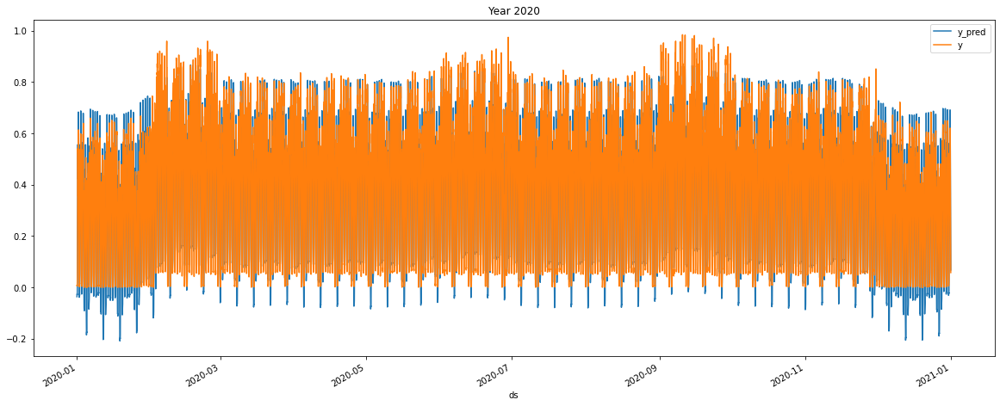

In [ ]:
init_date = '2020-01-01'
end_date = '2020-12-31'
ax_2020=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_2020)
plt.title('Year 2020')

### Plots per month

Text(0.5, 1.0, 'January\n 2020-01-01 to 2020-01-31')

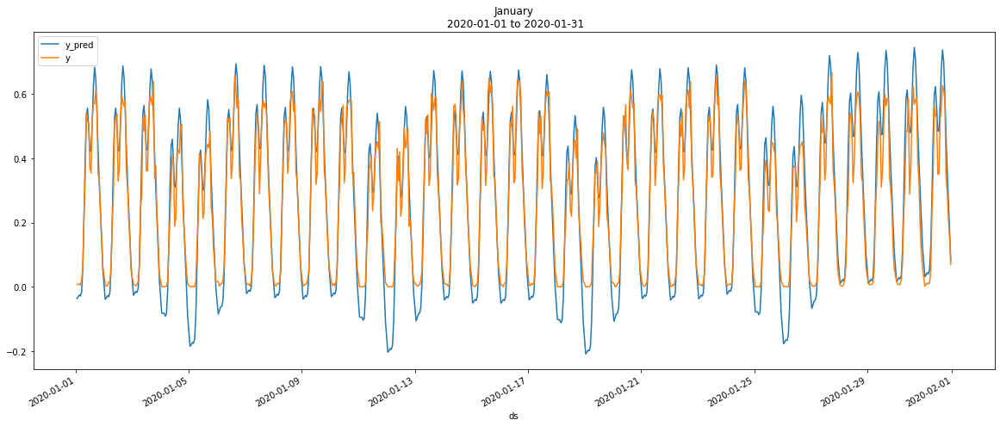

In [ ]:
init_date = '2020-01-01'
end_date = '2020-01-31'
ax_jan=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_jan)
plt.title('January\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May\n 2020-05-01 to 2020-05-31')

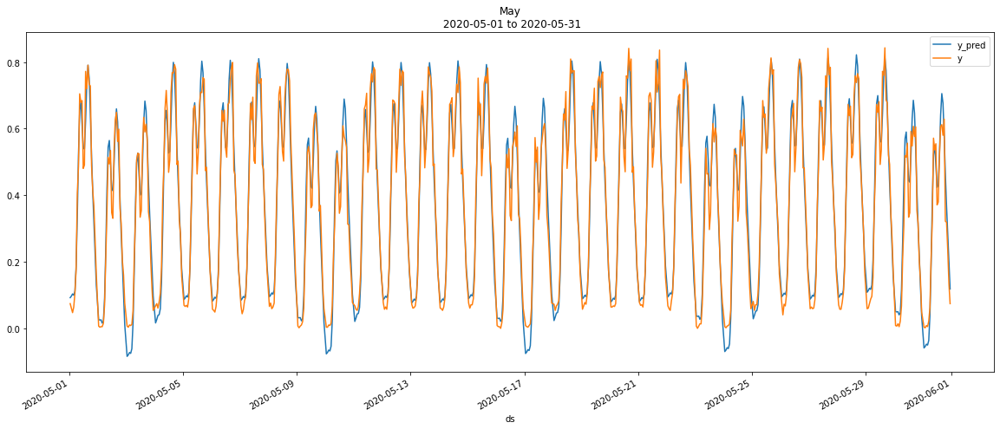

In [ ]:
init_date = '2020-05-01'
end_date = '2020-05-31'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'July\n 2020-07-01 to 2020-07-31')

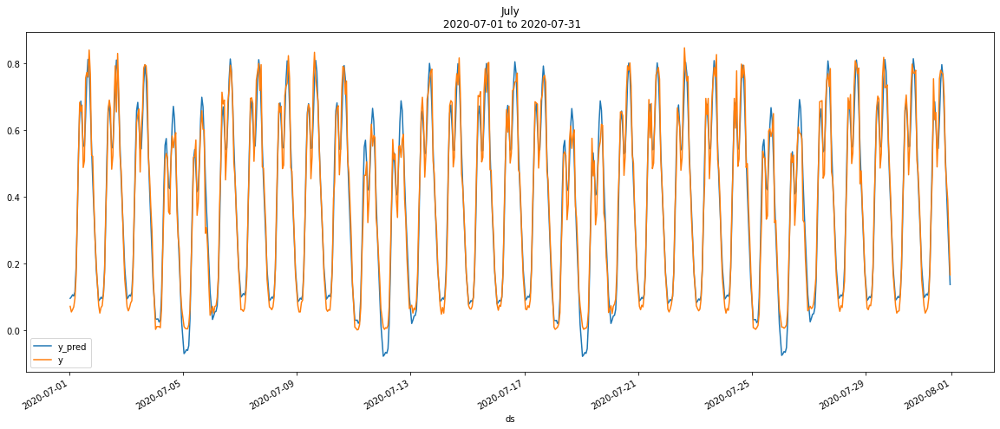

In [ ]:
init_date = '2020-07-01'
end_date = '2020-07-31'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('July\n %s to %s'%(init_date, end_date))

### Plots per week

Text(0.5, 1.0, 'May\n 2020-05-04 to 2020-05-11')

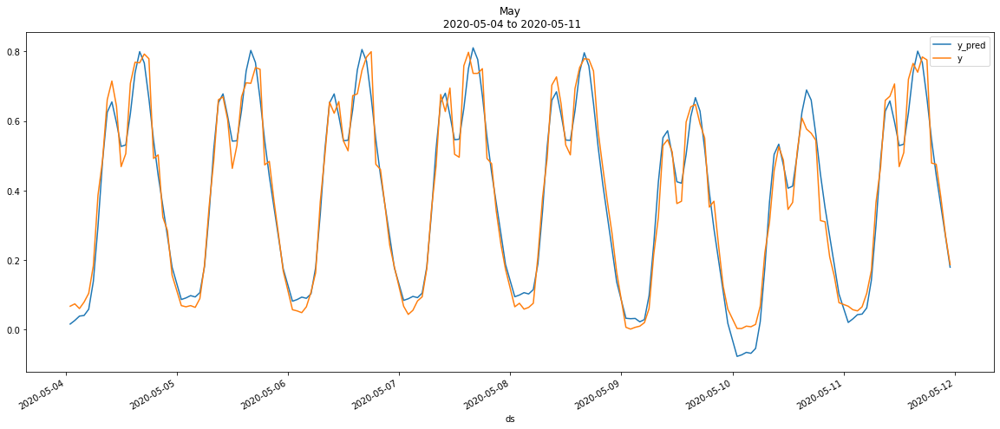

In [ ]:
init_date = '2020-05-04'
end_date = '2020-05-11'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May\n 2020-05-18 to 2020-05-25')

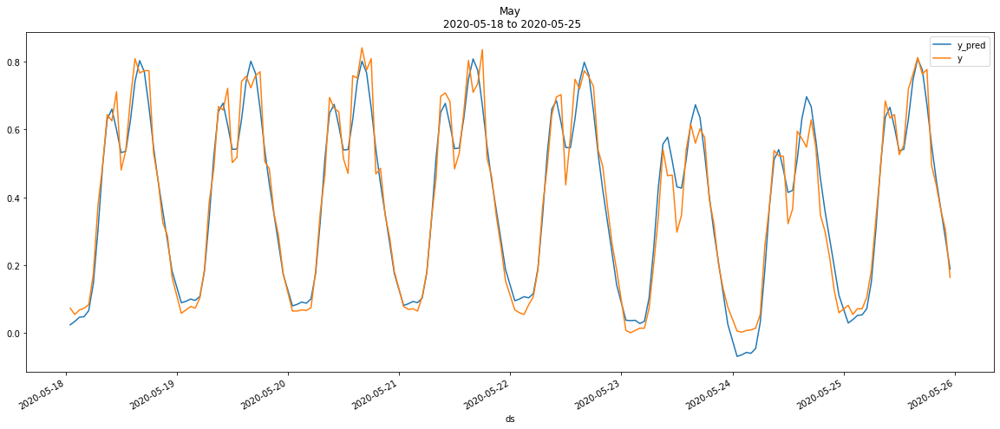

In [ ]:
init_date = '2020-05-18'
end_date = '2020-05-25'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May\n %s to %s'%(init_date, end_date))

### Plots per day

Text(0.5, 1.0, 'May: monday\n 2020-05-04 01:00:00 to 2020-05-04 23:00:00')

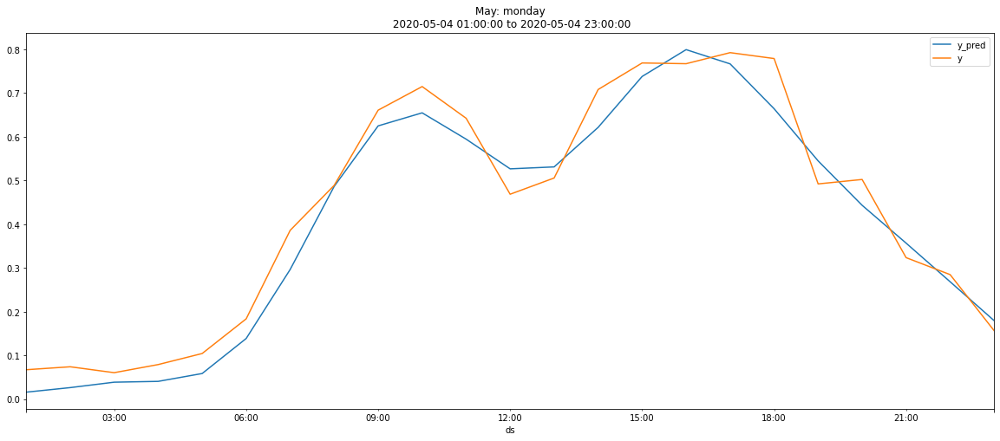

In [ ]:
init_date = '2020-05-04 01:00:00'
end_date = '2020-05-04 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: monday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: tuesday\n 2020-05-05 01:00:00 to 2020-05-05 23:00:00')

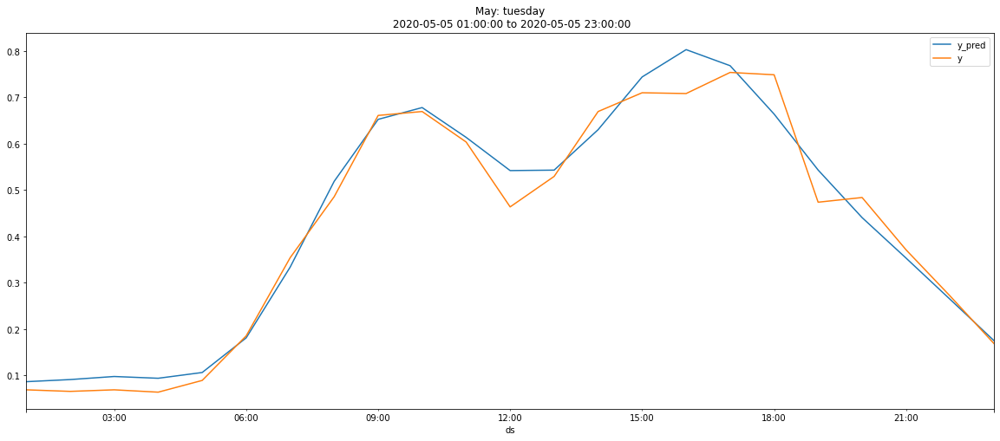

In [ ]:
init_date = '2020-05-05 01:00:00'
end_date = '2020-05-05 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: tuesday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: wednesday\n 2020-05-06 01:00:00 to 2020-05-06 23:00:00')

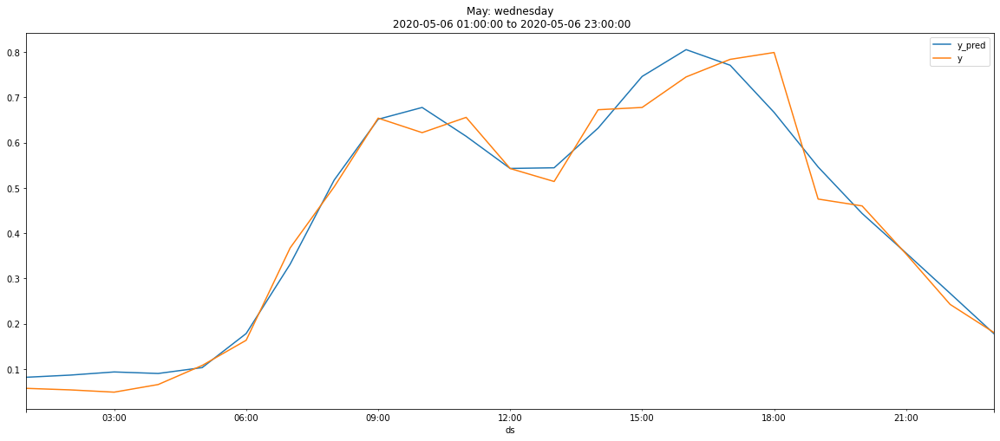

In [ ]:
init_date = '2020-05-06 01:00:00'
end_date = '2020-05-06 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: wednesday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: thursday\n 2020-05-07 01:00:00 to 2020-05-07 23:00:00')

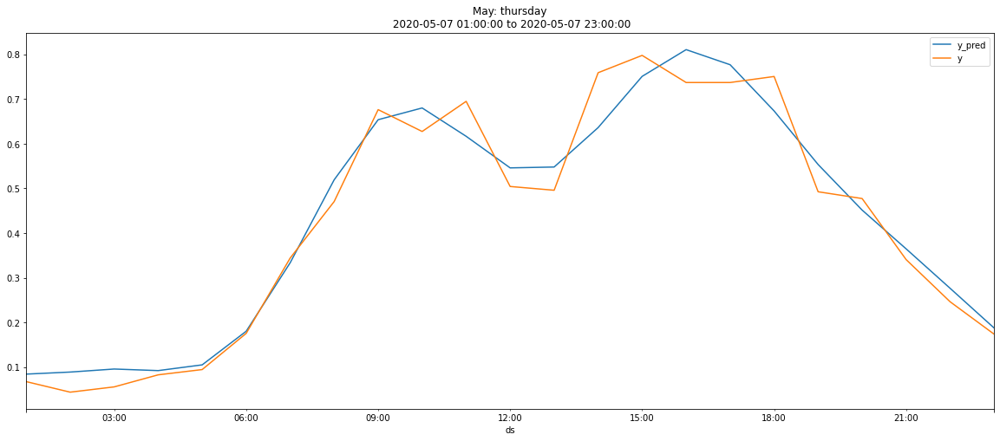

In [ ]:
init_date = '2020-05-07 01:00:00'
end_date = '2020-05-07 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: thursday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: friday\n 2020-05-08 01:00:00 to 2020-05-08 23:00:00')

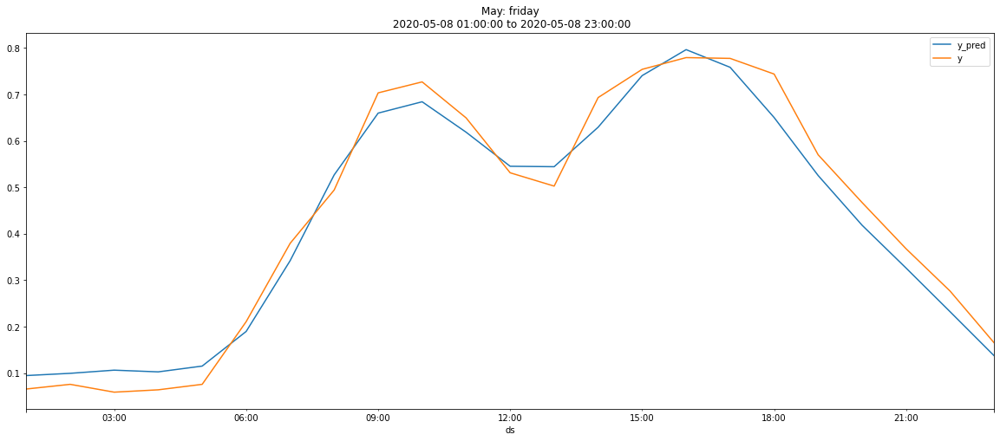

In [ ]:
init_date = '2020-05-08 01:00:00'
end_date = '2020-05-08 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: friday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: saturday\n 2020-05-09 01:00:00 to 2020-05-09 23:00:00')

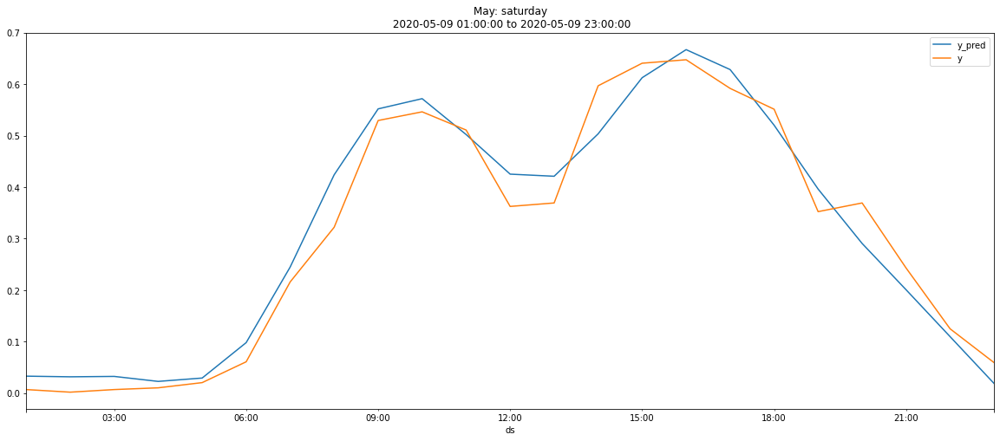

In [ ]:
init_date = '2020-05-09 01:00:00'
end_date = '2020-05-09 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: saturday\n %s to %s'%(init_date, end_date))

Text(0.5, 1.0, 'May: sunday\n 2020-05-10 01:00:00 to 2020-05-10 23:00:00')

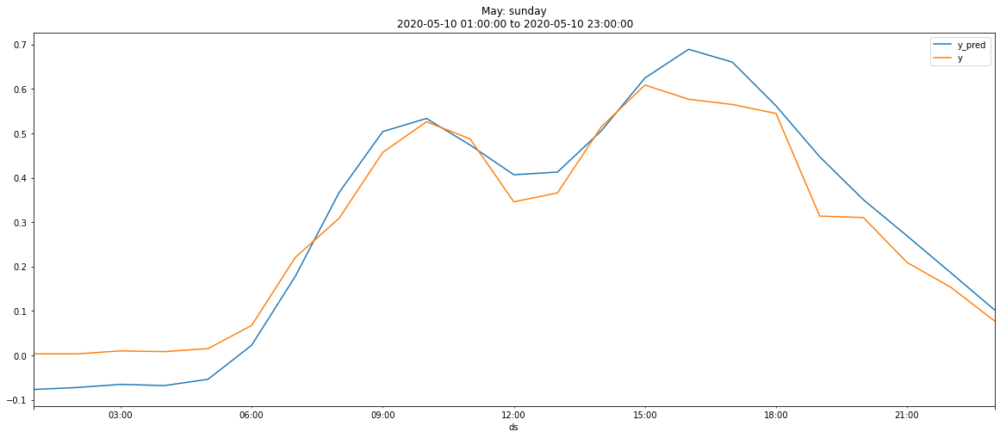

In [ ]:
init_date = '2020-05-10 01:00:00'
end_date = '2020-05-10 23:00:00'
ax_aug=y_pred_df_site[init_date:end_date].plot(x='ds',y='yhat',legend=True,label='y_pred',figsize=(20,8))
y_true_df_site[init_date:end_date].plot(x='ds',y='y',legend=True,label='y',ax=ax_aug)
plt.title('May: sunday\n %s to %s'%(init_date, end_date))

### Parallel forecast using multiple cpu cores (incomplete)

In [ ]:
start_time = time.time()
pool = Pool(cpu_count())
predictions = list(tqdm(pool.imap(prophet_instance_model_v2.predict, timeseries[:2]), total=len(timeseries))) 
#TODO: check imap module object is not callable
pool.close()
pool.join()
print("--- %s seconds ---" % (time.time() - start_time))